# 1) Setup

In [2]:
#libraries
from __future__ import print_function
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sbn
from time import time
import re

import librosa
import librosa.display
import libfmp.c3
import libtsm
import soundfile
import pydub

import os
import IPython.display as ipd
print("done")

done


In [3]:
# custom functions

#perform alignment
from loadfile import *
from extract_chroma import *
from extract_chroma_cens import *
from extract_features import *
from dtw_path import *

#visualisations
from visualise_path import *
from visualise_path_raw import *
from plot_paths import *

#verification
from verify_frame import *
from verify_frame_check import *
from verify_tsm import *

#utility
from flip_P import *

#pitch
from start_pitch import *

#tempo

print("done")

done


In [4]:
#music filenames
#naming convention is numbered: piece-extract-version
#e.g. Mendelssohn-slow-musescore is 110
filename110 = "audio/Mendelssohn_musescore_short_slow.mp3"
filename111 = "audio/Mendelssohn_good_short_slow.m4a"
filename112 = "audio/Mendelssohn_errors_short_slow.m4a"
filename120 = "audio/Mendelssohn_musescore_short_fast.mp3"
filename121 = "audio/Mendelssohn_good_short_fast.m4a"
filename122 = "audio/Mendelssohn_errors_short_fast.m4a"
print("done")


done


In [5]:
#params
sr = 11025
n_fft=4410
hop_size=512
spacing = 32
nlines = 30

# 2) Alignment

## 2a) Load files

C:\Users\pyliu\anaconda3\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
C:\Users\pyliu\anaconda3\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


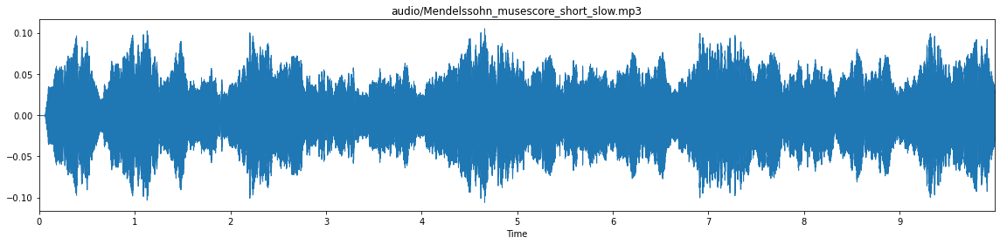

In [6]:
x110, fs110 = loadfile(filename110,sr = sr, plot_graph= True)
x111, fs111 = loadfile(filename111,sr = sr, plot_graph= False)
x112, fs112 = loadfile(filename112,sr = sr, plot_graph= False)
x120, fs120 = loadfile(filename120,sr = sr, plot_graph= False)
x121, fs121 = loadfile(filename121,sr = sr, plot_graph= False)
x122, fs122 = loadfile(filename122,sr = sr, plot_graph= False)

## 2b) Extract Features

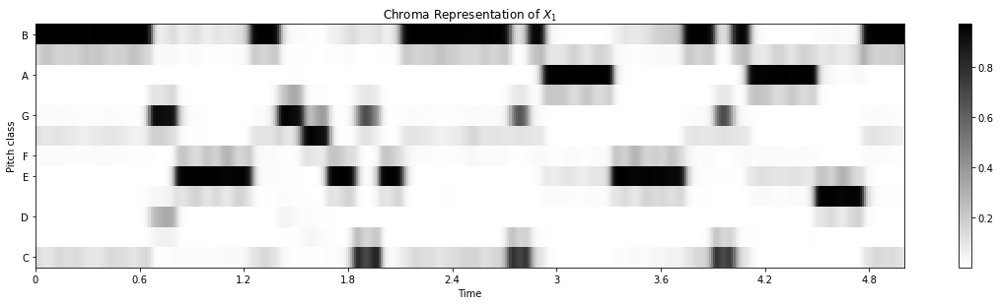

In [6]:
#chroma features
x110_chroma = extract_chroma(x110,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=True)
x111_chroma = extract_chroma(x111,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=False)
x112_chroma = extract_chroma(x112,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=False)
x120_chroma = extract_chroma(x120,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=False)
x121_chroma = extract_chroma(x121,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=False)
x122_chroma = extract_chroma(x122,sr,n_fft=n_fft,hop_size=hop_size,plot_graph=False)

## 3c) Compute DTW optimal paths

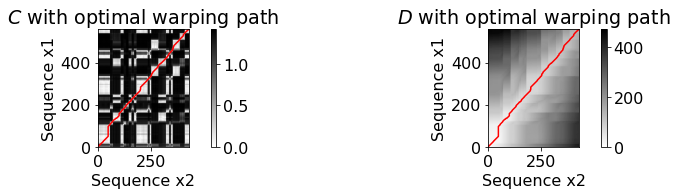

In [129]:
C111_110, D111_110, P111_110 = dtw_path(x111_chroma, x110_chroma, plot_graph = True)
C112_110, D112_110, P112_110 = dtw_path(x112_chroma, x110_chroma, plot_graph = False)
C112_111, D112_111, P112_111 = dtw_path(x112_chroma, x111_chroma, plot_graph = False)
C121_120, D121_120, P121_120 = dtw_path(x121_chroma, x120_chroma, plot_graph = False)
C122_120, D122_120, P122_120 = dtw_path(x122_chroma, x120_chroma, plot_graph = False)
C122_121, D122_121, P122_121 = dtw_path(x122_chroma, x121_chroma, plot_graph = False)

# 3) Visualise corresponding points

## 3a) Audio signal

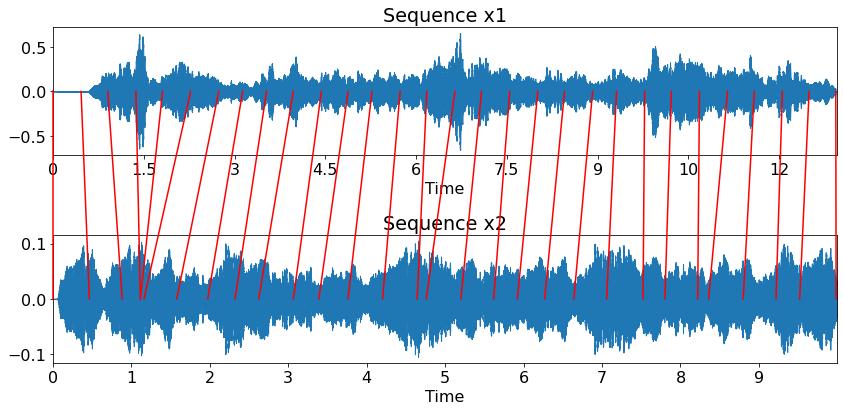

In [130]:
visualise_path_raw(x111,x110,sr,P111_110,nlines = nlines,hop_size = hop_size)
#visualise_path_raw(x112,x110,sr,P112_110,nlines = nlines,hop_size = hop_size)
#visualise_path_raw(x112,x111,sr,P112_111,nlines = nlines,hop_size = hop_size)
#visualise_path_raw(x121,x120,sr,P121_120,nlines = nlines,hop_size = hop_size)
#visualise_path_raw(x122,x120,sr,P122_120,nlines = nlines,hop_size = hop_size)
#visualise_path_raw(x122,x121,sr,P122_121,nlines = nlines,hop_size = hop_size)

## 3b) Chroma spectrogram

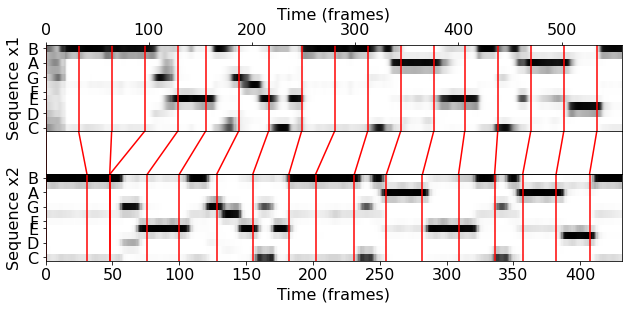

In [131]:
visualise_path(x111_chroma,x110_chroma,P111_110,spacing = spacing,hop_size = hop_size)
#visualise_path(x112_chroma,x110_chroma,P112_110,spacing = spacing,hop_size = hop_size)
#visualise_path(x112_chroma,x111_chroma,P112_111,spacing = spacing,hop_size = hop_size)
#visualise_path(x121_chroma,x120_chroma,P121_120,spacing = spacing,hop_size = hop_size)
#visualise_path(x122_chroma,x120_chroma,P122_120,spacing = spacing,hop_size = hop_size)
#visualise_path(x122_chroma,x121_chroma,P122_121,spacing = spacing,hop_size = hop_size)

# 4) Verification

## 4a) Random (or specific) frame 

In [132]:
verify_frame(x111,x110,sr,P111_110,frame = -1, hop_size=hop_size, verbose = True)
#verify_frame(x112,x110,sr,P112_110,frame = -1, hop_size=hop_size, verbose = True)
#verify_frame(x112,x111,sr,P112_111,frame = -1, hop_size=hop_size, verbose = True)
#verify_frame(x121,x120,sr,P121_120,frame = -1, hop_size=hop_size, verbose = True)
#verify_frame(x122,x120,sr,P122_120,frame = -1, hop_size=hop_size, verbose = True)
#verify_frame(x122,x121,sr,P122_121,frame = -1, hop_size=hop_size, verbose = True)

frame in P = 363, sample in x1 = 90880, sample in x2 = 66816


## 4b) Time Scale Modifiction (TSM)

In [133]:
combined111_110 = verify_tsm(x111,x110,sr,P111_110,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined112_110 = verify_tsm(x112,x110,sr,P112_110,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)

combined121_120 = verify_tsm(x121,x120,sr,P121_120,hop_size = hop_size, dim_x1 = -5,dim_x2 = 0,combined = True)
combined122_120 = verify_tsm(x122,x120,sr,P122_120,hop_size = hop_size, dim_x1 = 0,dim_x2 = 2,combined = True)


C:\Users\pyliu\anaconda3\lib\site-packages\libtsm\tsm.py:209: RuntimeWarning: divide by zero encountered in true_divide
  min_fac = np.min(syn_hop / ana_hop[1:])  # the minimal local stretching factor


In [134]:
#combined111_110
#combined112_110
combined121_120
#combined122_120

Ideas for further progress
- automatically find and select beginning/end points of extracts
- get stats on verification success by checking aurally for clashes. If no clashes, then randomly sample X times. Listen to each "matching" recording and calculate percentage on the correct note. Also, is there a method to automatically compare notes pitches? If so, once we determine that the recordings have no clashes, we can simply confirm that the initial pitch is correct. This saves verification time.
- record more pieces
- which part of B2 shall I do?
- alternative features: https://librosa.org/doc/main/auto_examples/plot_chroma.html + Computational methods paper + ChromaVariants2010. CENS & DLNCO



# 5) Alternative Features - no mistakes

## 5a) Extract features

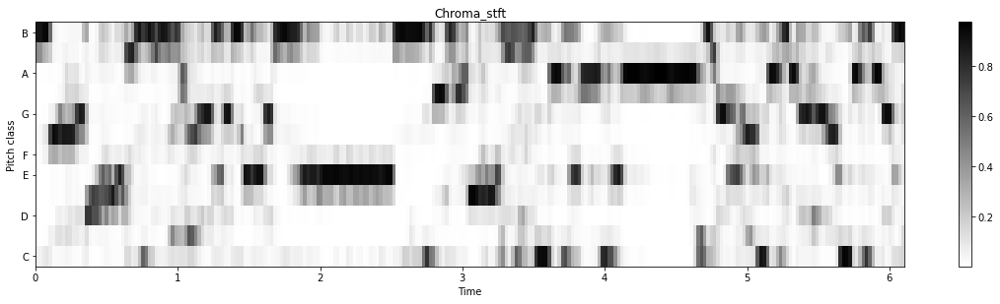

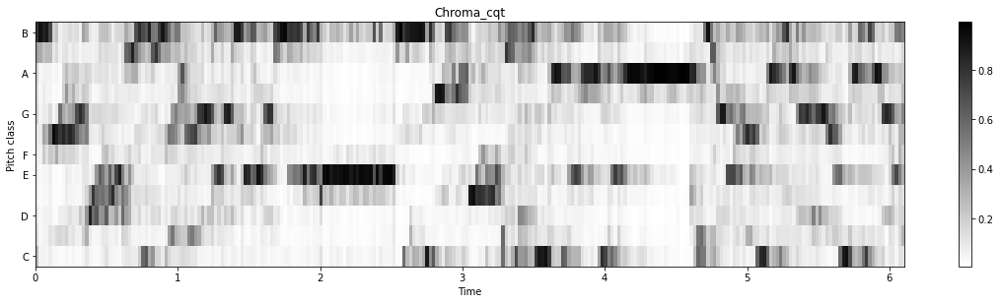

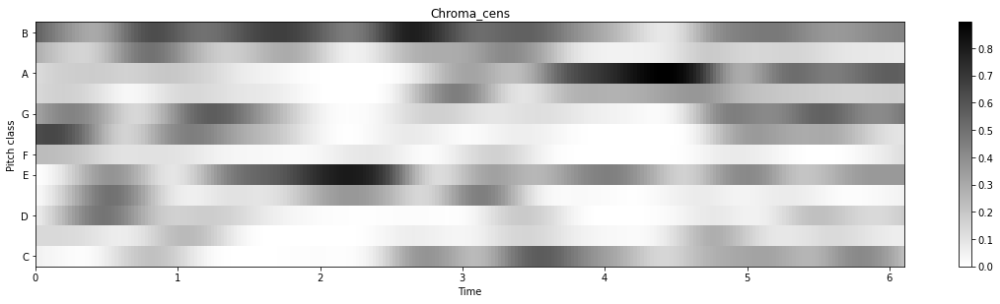

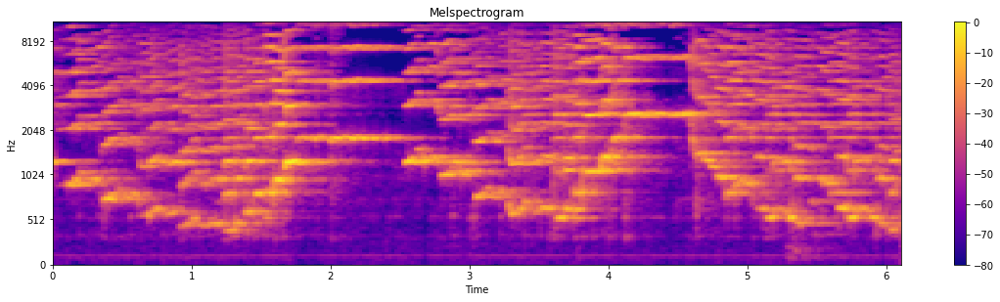

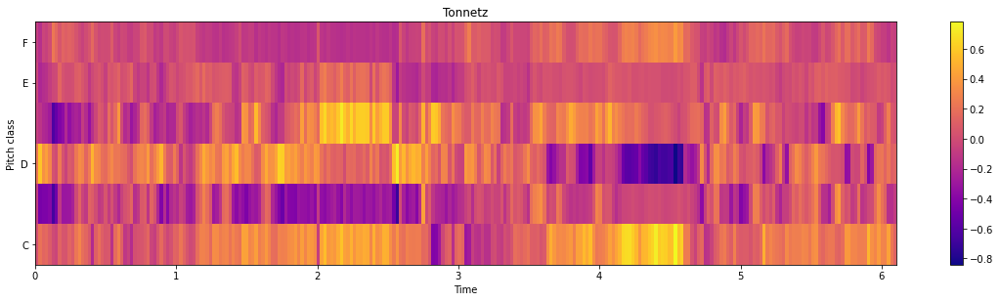

In [7]:
#chroma features with stft
x121_stft = extract_features(x121,sr,method = "stft",hop_size=hop_size,plot_graph=True)
x120_stft = extract_features(x120,sr,method = "stft",hop_size=hop_size,plot_graph=False)
#chroma features with constant q-transform
x121_cqt = extract_features(x121,sr,method = "cqt",hop_size=hop_size,plot_graph=True)
x120_cqt = extract_features(x120,sr,method = "cqt",hop_size=hop_size,plot_graph=False)
#chroma features with cens
x121_cens = extract_features(x121,sr,method = "cens",hop_size=hop_size,plot_graph=True)
x120_cens = extract_features(x120,sr,method = "cens",hop_size=hop_size,plot_graph=False)
#melspectrogram
x121_mel = extract_features(x121,sr,method = "mel",hop_size=hop_size,plot_graph=True)
x120_mel = extract_features(x120,sr,method = "mel",hop_size=hop_size,plot_graph=False)
#chromagram with tonnetz features (6 features)
x121_tonnetz = extract_features(x121,sr,method = "tonnetz",hop_size=hop_size,plot_graph=True)
x120_tonnetz = extract_features(x120,sr,method = "tonnetz",hop_size=hop_size,plot_graph=False)
#zero crossing rate
x121_zero = extract_features(x121,sr,method = "zero",hop_size=hop_size,plot_graph=True)
x120_zero = extract_features(x120,sr,method = "zero",hop_size=hop_size,plot_graph=False)

## 5b) DTW

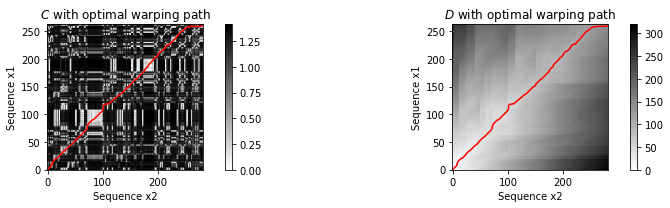

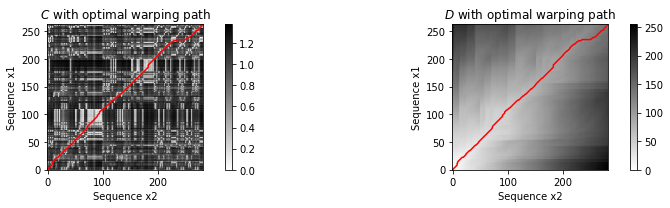

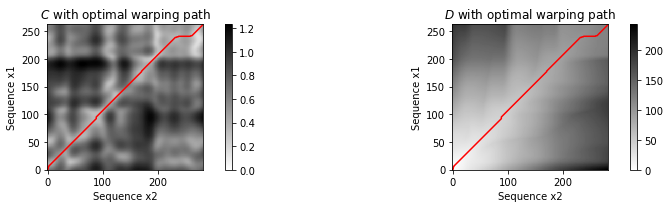

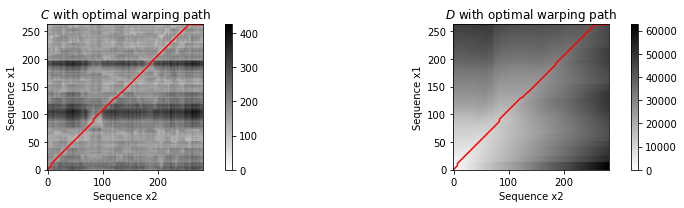

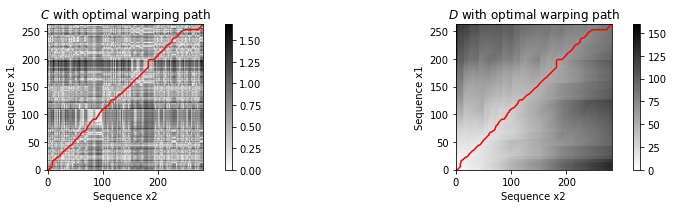

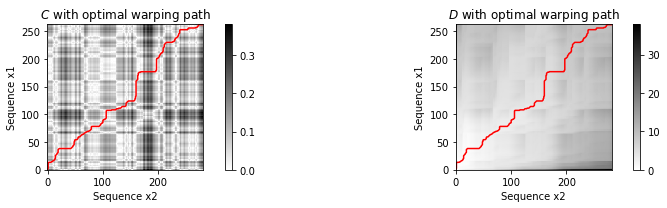

In [8]:
C_stft, D_stft, P_stft = dtw_path(x121_stft, x120_stft, plot_graph = True)
C_cqt, D_cqt, P_cqt = dtw_path(x121_cqt, x120_cqt, plot_graph = True)
C_cens, D_cens, P_cens = dtw_path(x121_cens, x120_cens, plot_graph = True)
C_mel, D_mel, P_mel = dtw_path(x121_mel, x120_mel, plot_graph = True)
C_tonnetz, D_tonnetz, P_tonnetz = dtw_path(x121_tonnetz, x120_tonnetz, plot_graph = True)
C_zero, D_zero, P_zero = dtw_path(x121_zero, x120_zero, plot_graph = True)

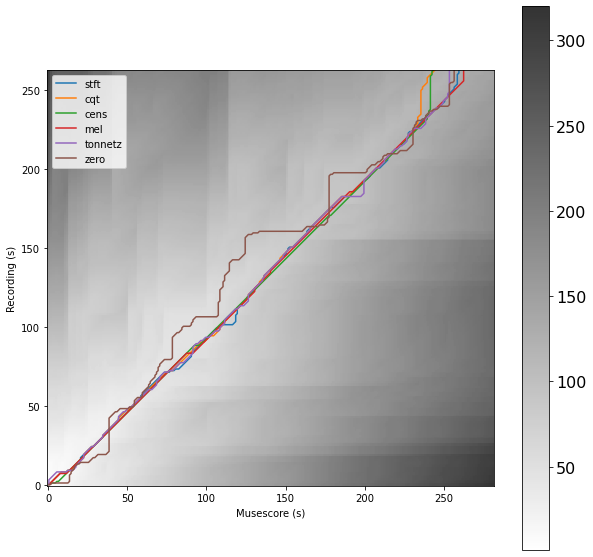

In [9]:
#overlay all paths
P_list = [P_stft, P_cqt, P_cens, P_mel, P_tonnetz, P_zero]
P_labels = ["stft", "cqt", "cens", "mel", "tonnetz", "zero"]
plot_paths(P_list, P_labels, D_stft,flip_label = False, colormap = True, figsize = (10,10), fontsize = 16)

## 5c) Visualise correspondences

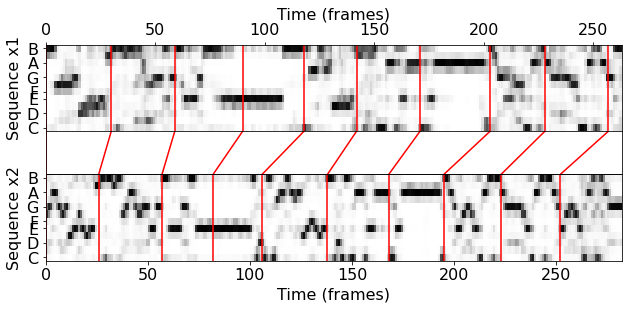

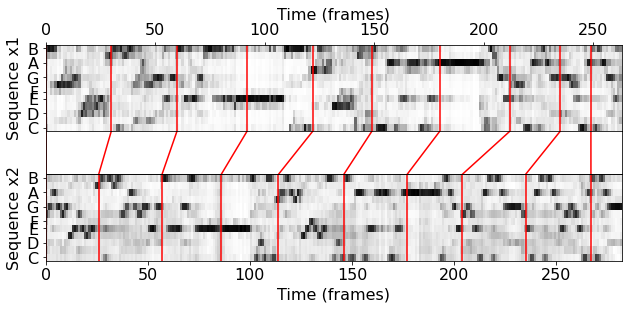

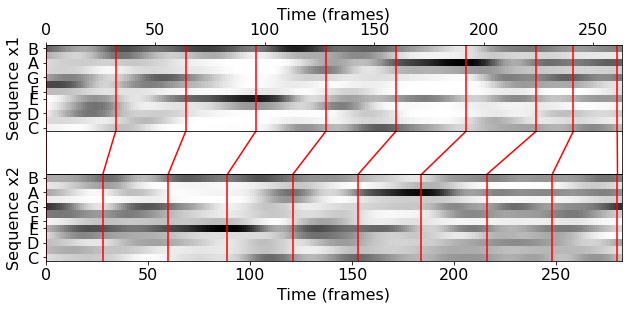

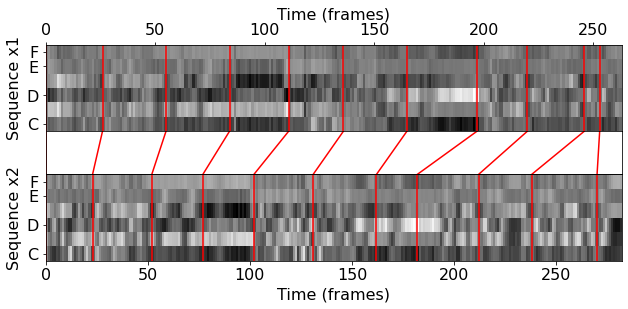

In [10]:
#chromagrams - mel & zero_crossing_rate don't have chromagrams
visualise_path(x121_stft,x120_stft,P_stft,spacing = spacing,hop_size = hop_size)
visualise_path(x121_cqt,x120_cqt,P_cqt,spacing = spacing,hop_size = hop_size)
visualise_path(x121_cens,x120_cens,P_cens,spacing = spacing,hop_size = hop_size)
visualise_path(x121_tonnetz,x120_tonnetz,P_tonnetz,spacing = spacing,hop_size = hop_size)

## 5d) Verification

In [11]:
#chroma stft
combined_stft = verify_tsm(x121,x120,sr,P_stft,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_stft

C:\Users\pyliu\anaconda3\lib\site-packages\libtsm\tsm.py:209: RuntimeWarning: divide by zero encountered in true_divide
  min_fac = np.min(syn_hop / ana_hop[1:])  # the minimal local stretching factor


In [12]:
#chroma cqt
combined_cqt = verify_tsm(x121,x120,sr,P_cqt,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_cqt

In [13]:
#chroma cens
combined_cens = verify_tsm(x121,x120,sr,P_cens,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_cens

In [35]:
verify_frame_check(x121,x120,sr,P_mel,n_checks = 10, check_window = 1, hop_size=hop_size)


Total: 10
n_correct: 5


5

# 6) Alternative Features - with mistakes

## 6a) Extract features

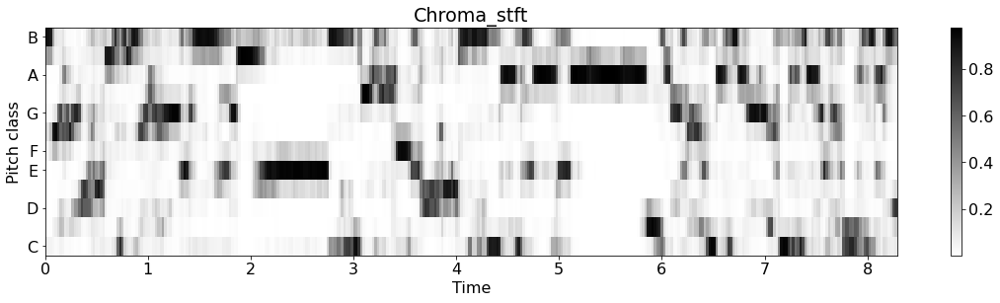

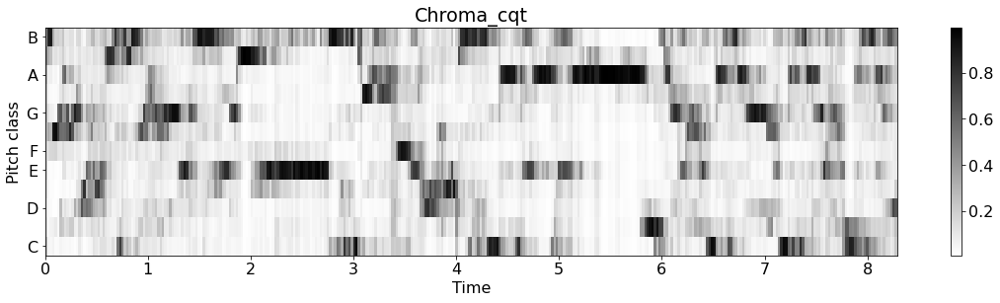

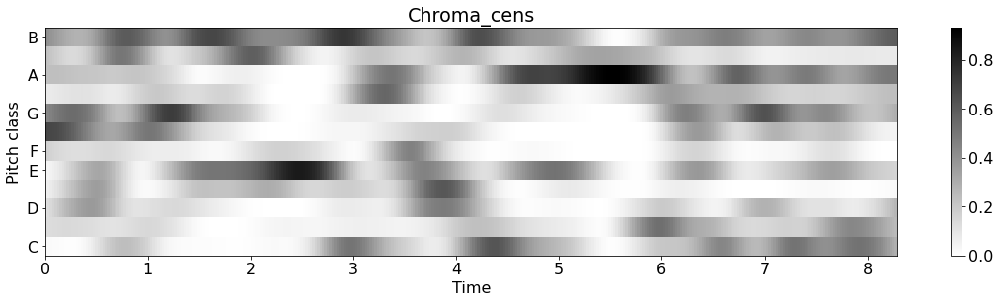

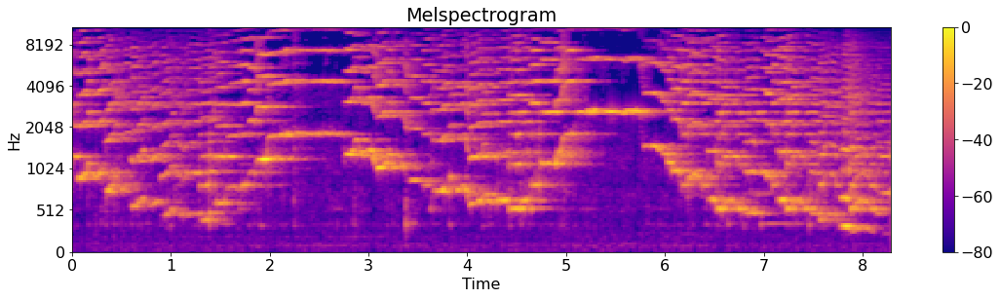

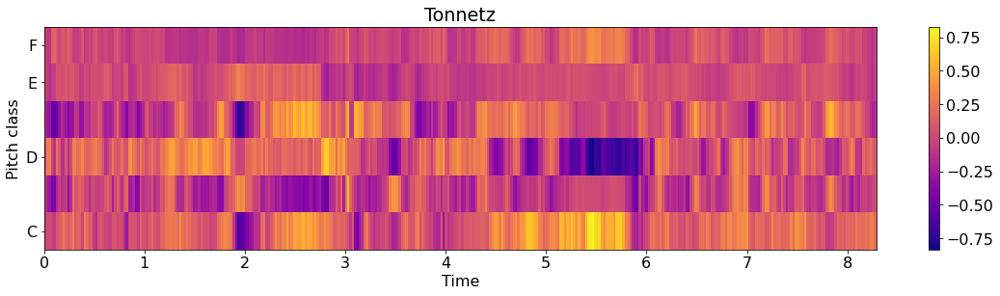

In [36]:
#chroma features with stft
x122_stft = extract_features(x122,sr,method = "stft",hop_size=hop_size,plot_graph=True)
x120_stft = extract_features(x120,sr,method = "stft",hop_size=hop_size,plot_graph=False)
#chroma features with constant q-transform
x122_cqt = extract_features(x122,sr,method = "cqt",hop_size=hop_size,plot_graph=True)
x120_cqt = extract_features(x120,sr,method = "cqt",hop_size=hop_size,plot_graph=False)
#chroma features with cens
x122_cens = extract_features(x122,sr,method = "cens",hop_size=hop_size,plot_graph=True)
x120_cens = extract_features(x120,sr,method = "cens",hop_size=hop_size,plot_graph=False)
#melspectrogram
x122_mel = extract_features(x122,sr,method = "mel",hop_size=hop_size,plot_graph=True)
x120_mel = extract_features(x120,sr,method = "mel",hop_size=hop_size,plot_graph=False)
#chromagram with tonnetz features (6 features)
x122_tonnetz = extract_features(x122,sr,method = "tonnetz",hop_size=hop_size,plot_graph=True)
x120_tonnetz = extract_features(x120,sr,method = "tonnetz",hop_size=hop_size,plot_graph=False)
#zero crossing rate
x122_zero = extract_features(x122,sr,method = "zero",hop_size=hop_size,plot_graph=True)
x120_zero = extract_features(x120,sr,method = "zero",hop_size=hop_size,plot_graph=False)

## 5b) DTW

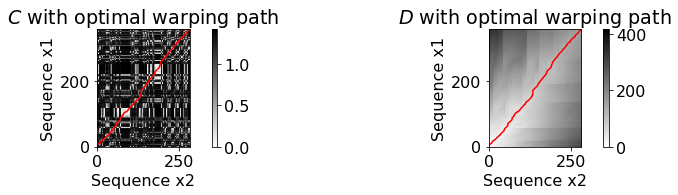

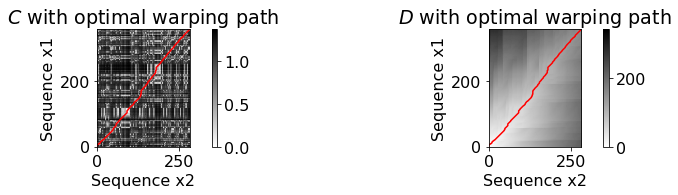

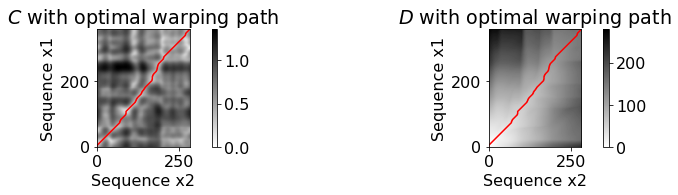

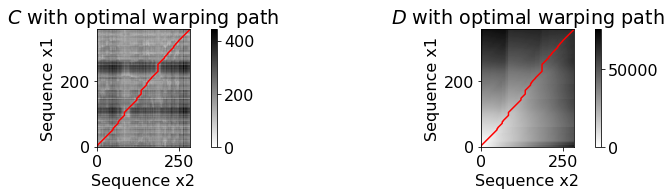

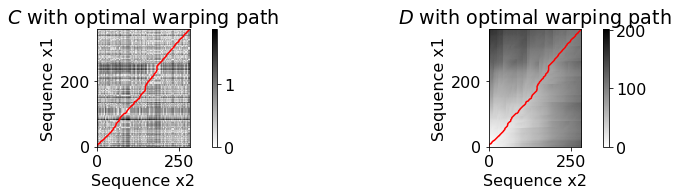

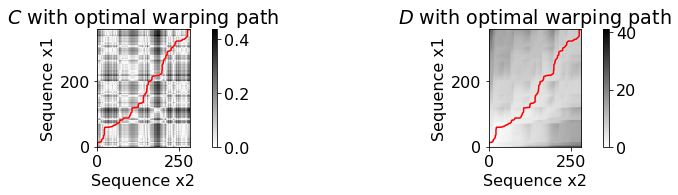

In [37]:
C_stft122, D_stft122, P_stft122 = dtw_path(x122_stft, x120_stft, plot_graph = True)
C_cqt122, D_cqt122, P_cqt122 = dtw_path(x122_cqt, x120_cqt, plot_graph = True)
C_cens122, D_cens122, P_cens122 = dtw_path(x122_cens, x120_cens, plot_graph = True)
C_mel122, D_mel122, P_mel122 = dtw_path(x122_mel, x120_mel, plot_graph = True)
C_tonnetz122, D_tonnetz122, P_tonnetz122 = dtw_path(x122_tonnetz, x120_tonnetz, plot_graph = True)
C_zero122, D_zero122, P_zero122 = dtw_path(x122_zero, x120_zero, plot_graph = True)

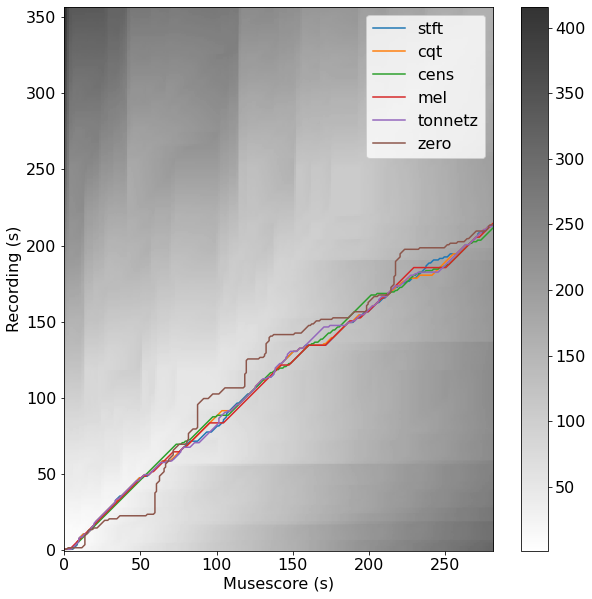

In [39]:
#overlay all paths
P_list = [P_stft122, P_cqt122, P_cens122, P_mel122, P_tonnetz122, P_zero122]
P_labels = ["stft", "cqt", "cens", "mel", "tonnetz", "zero"]
plot_paths(P_list, P_labels, D_stft122,flip_label = False, colormap = True, figsize = (10,10), fontsize = 16)

## 5c) Visualise correspondences

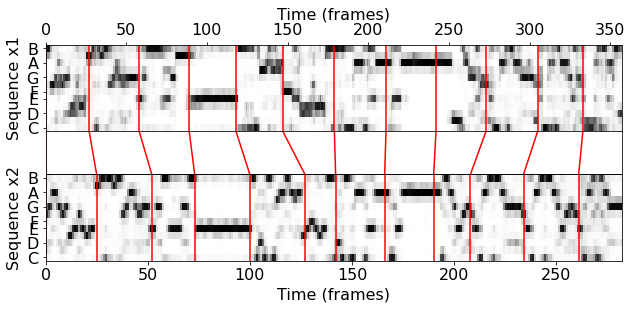

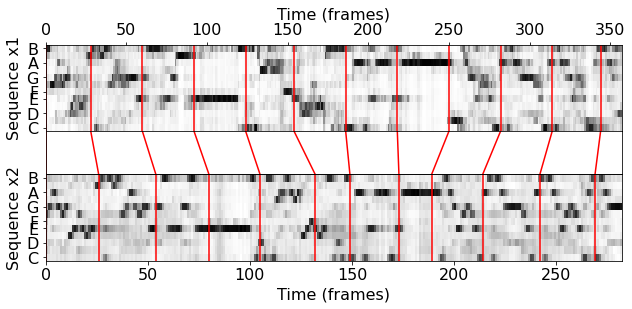

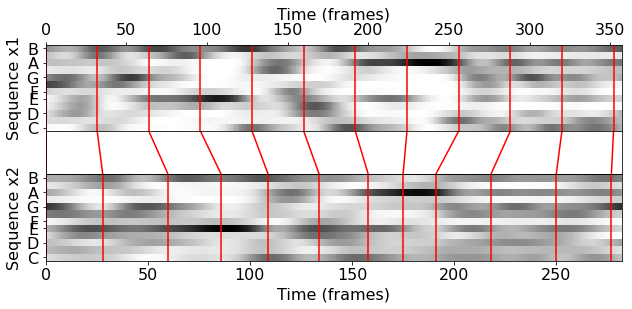

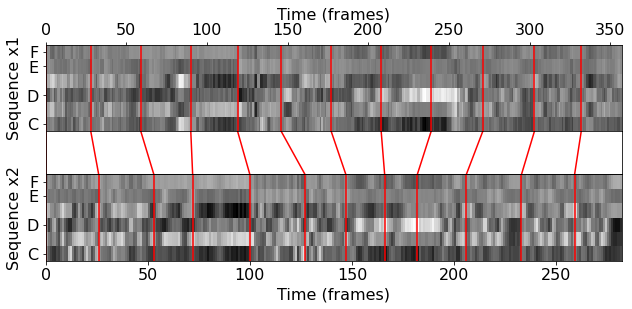

In [40]:
#chromagrams - mel & zero_crossing_rate don't have chromagrams
visualise_path(x122_stft,x120_stft,P_stft122,spacing = spacing,hop_size = hop_size)
visualise_path(x122_cqt,x120_cqt,P_cqt122,spacing = spacing,hop_size = hop_size)
visualise_path(x122_cens,x120_cens,P_cens122,spacing = spacing,hop_size = hop_size)
visualise_path(x122_tonnetz,x120_tonnetz,P_tonnetz122,spacing = spacing,hop_size = hop_size)

## 5d) Verification

In [41]:
#chroma stft
combined_stft122 = verify_tsm(x122,x120,sr,P_stft122,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_stft122

C:\Users\pyliu\anaconda3\lib\site-packages\libtsm\tsm.py:209: RuntimeWarning: divide by zero encountered in true_divide
  min_fac = np.min(syn_hop / ana_hop[1:])  # the minimal local stretching factor


In [42]:
#chroma cqt
combined_cqt122 = verify_tsm(x122,x120,sr,P_cqt122,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_cqt122

In [43]:
#chroma cens
combined_cens122 = verify_tsm(x122,x120,sr,P_cens122,hop_size = hop_size, dim_x1 = 0,dim_x2 = 0,combined = True)
combined_cens122

In [44]:
verify_frame_check(x122,x120,sr,P_mel,n_checks = 10, check_window = 1, hop_size=hop_size)


Total: 10
n_correct: 3


3